<a href="https://colab.research.google.com/github/Chichi213/Daiz_CPE-313/blob/main/Daiz_HOA_4_1_Object_Detection_and_Recognition_Techniques.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 1. Objectives

This activity aims to introduce students to object detection and recongition through the use of histogram of gradients (HoG), image pyramids and sliding windows in OpenCV.

## 2. Intended Learning Outcomes (ILOs)
After this activity, the students should be able to:
* Demonstrate object detection and recognition using histogram of gradients, image pyramids and sliding windows in OpenCV.
* Evaluate the performance of the object detection and recognition techniques in OpenCV.

## 3. Procedures and Outputs

When it comes to recognizing and detecting objects, there are a number of techniques used in computer vision, which we'll be examining:
* Histogram of Oriented Gradients
* Image pyramids
* Sliding windows

Unlike feature detection algorithms, these are not mutually exclusive techniques, rather, they are complimentary. You can perform a Histogram of Oriented Gradients (HOG) while applying the sliding windows technique. So, let's take a look at HOG first and understand what it is.

### History of Gradients (HoG) Descriptors

HOG is a feature descriptor, so it belongs to the same family of algorithms, such as SIFT, SURF, and ORB.

It is used in image and video processing to detect objects. Its internal mechanism is really clever; an image is divided into portions and a gradient for each portion is calculated. We've observed a similar approach when we talked about face recognition through LBPH.

HOG, however, calculates histograms that are not based on color values, rather, they are based on gradients. As HOG is a feature descriptor, it is capable of delivering the type of information that is vital for feature matching and object detection/recognition.

Before diving into the technical details of how HOG works, let's first take a look at how HOG sees the world; here is an image of a truck:

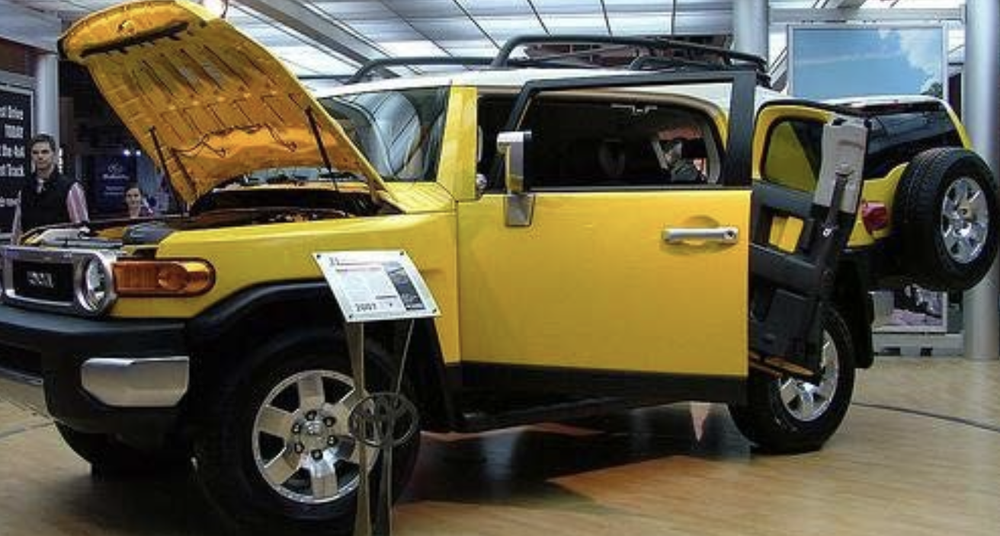

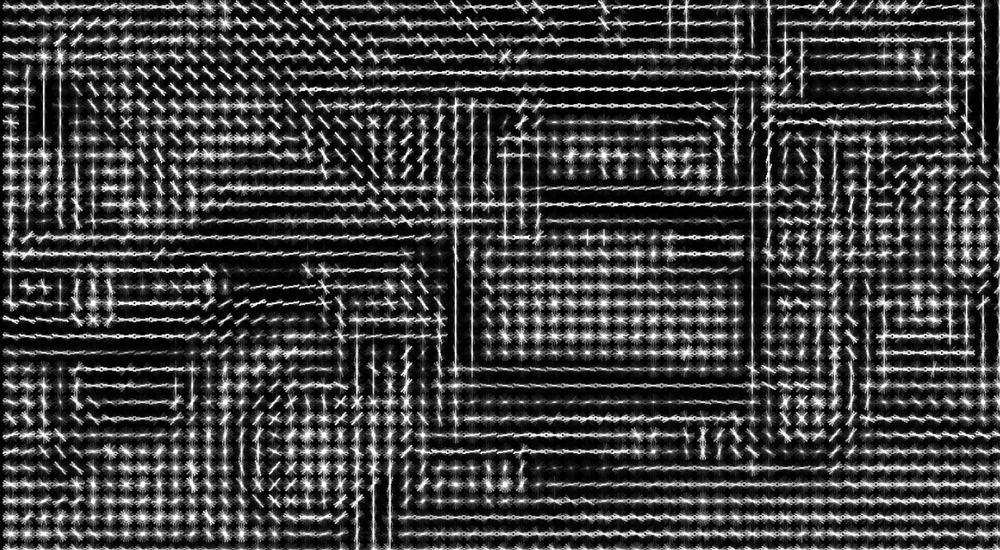

**Question: Here you are shown the original image and how HOG sees the image. Analyze the output and provide a description. Are you able to see that it is the same image?**

**The image is somewhat visible, showing that the HOG (Histogram of Oriented Gradients) interprets images by recognizing various shapes and forms. While it can discern basic features like wheels, it struggles with finer details such as the precise locations of doors.**

The extrapolation of histograms into descriptors is quite a complex process.
- First, local histograms for each cell are calculated. The cells are grouped into larger regions called blocks. These blocks can be made of any number of cells, but Dalal and Triggs found that 2x2 cell blocks yielded the best results when performing people detection.
- A block-wide vector is created so that it can be normalized, accounting for variations in illumination and shadowing (a single cell is too small a region to detect such variations). This improves the accuracy of detection as it reduces the illumination and shadowing difference between the sample and the block being examined.
- Simply comparing cells in two images would not work unless the images are identical (both in terms of size and data).

There are two main problems to resolve:
1. Location
2. Scale

**The Scale Issue**

Imagine, for example, if your sample was a detail (say, a bike) extrapolated from a larger image, and you're trying to compare the two pictures. You would not obtain the same gradient signatures and the detection would fail (even though the bike is in both pictures).

**The Location Issue**

Once we've resolved the scale problem, we have another obstacle in our path: a potentially detectable object can be anywhere in the image, so we need to scan the entire image in portions to make sure we can identify areas of interest, and within these areas, try to detect objects. Even if a sample image and object in the image are of identical size, there needs to be a way to instruct OpenCV to locate this object. So, the rest of the image is discarded and a comparison is made on potentially matching regions.

*To obviate these problems, we need to familiarize ourselves with the concepts of image pyramid and sliding windows.*

### Image Pyramids

Many of the algorithms used in computer vision utilize a concept called pyramid. An image pyramid is a multiscale representation of an image. This diagram should
help you understand this concept:

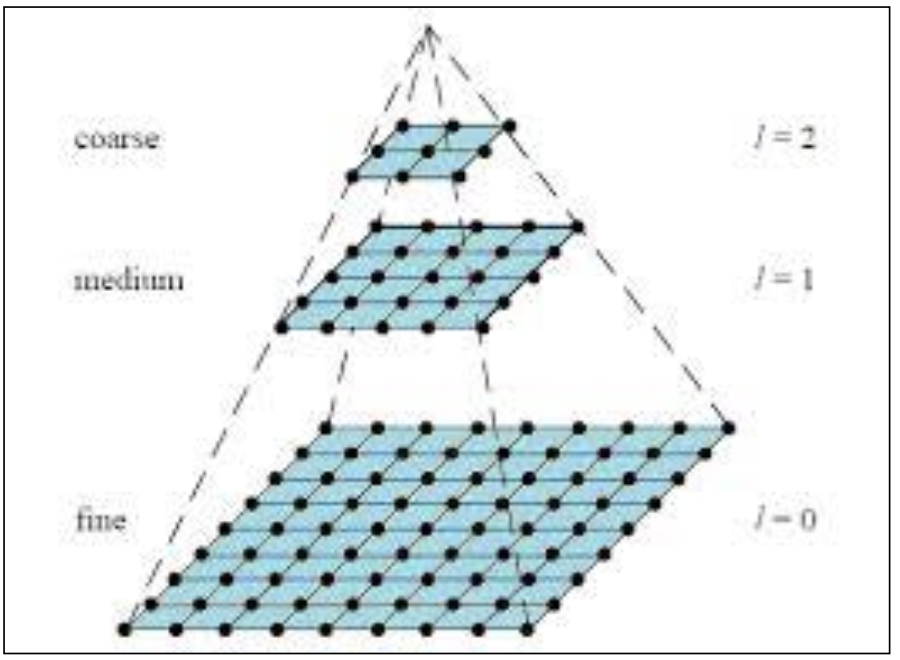

A multiscale representation of an image, or an image pyramid, helps you resolve the problem of detecting objects at different scales. The importance of this concept is easily explained through real-life hard facts, such as it is extremely unlikely that an object will appear in an image at the exact scale it appeared in our sample image.
Moreover, you will learn that object classifiers (utilities that allow you to detect objects in OpenCV) need training, and this training is provided through image databases made up of positive matches and negative matches. Among the positives, it is again unlikely that the object we want to identify will appear in the same scale throughout the training dataset.

**Follow the steps and create a function that can make an image Pyramid**:

1. Take an image.
2. Resize (smaller) the image using an arbitrary scale parameter.
3. Smoothen the image (using Gaussian blurring).
4. If the image is larger than an arbitrary minimum size, repeat the process from step 1.

Demonstrate by creating a function and showing the different scales of the image.

In [3]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

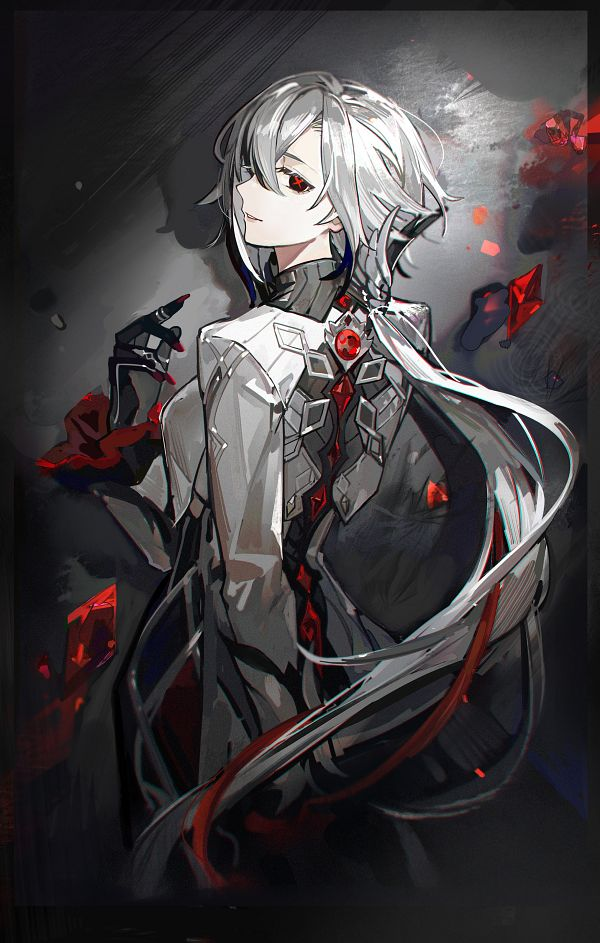

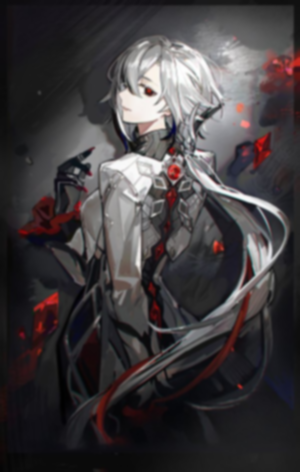

In [2]:
import cv2
from google.colab.patches import cv2_imshow

def resizeandblur(image, scale_factor, min_size):
  while True:
    cv2_imshow(image)
    image_resized = cv2.resize(image, None, fx=scale_factor, fy=scale_factor)
    image_blurred = cv2.GaussianBlur(image_resized, (5,5), 0)

    if min(image_resized.shape[:2]) < min_size:
      break
    else:
      image = image_blurred

  return image_blurred

image = cv2.imread('/content/drive/MyDrive/Data Sci 3/Arlecchino.600.4008094.jpg')
image_scaled = resizeandblur(image, scale_factor=0.5, min_size=500)

cv2_imshow(image_scaled)

### Sliding Windows

Sliding windows is a technique used in computer vision that consists of examining the shifting portions of an image (sliding windows) and operating detection on those using image pyramids. This is done so that an object can be detected at a multiscale level.

Sliding windows resolves location issues by scanning smaller regions of a larger image, and then repeating the scanning on different scales of the same image.

With this technique, each image is decomposed into portions, which allows discarding portions that are unlikely to contain objects, while the remaining portions are classified.

There is one problem that emerges with this approach, though: **overlapping regions**.

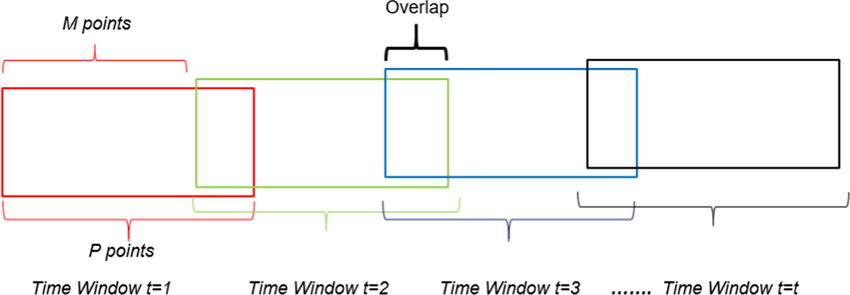

Here's where non-maximum suppression comes into play: given a set of overlapping regions, we can suppress all the regions that are not classified with the maximum score.

**Question: Research on the topic and provide ample discussion, what is non-maximum (or non-maxima) suppression? Provide examples and code.**

Non-maximum suprresion (NMS) is commonly used in object detection as a post-processing technique. This is used to eliminate duplicate detections, as well as select the most relevant bounding boxes. To recall, bounding boxes are typically used to mark specific parts of an image or data.
<br>
<br>
NMS works by comparing the confidence scores of the different bounding boxes and eliminating ones that overlap significantly with a higher scoring bounding box.NMS is needed, as most object detection, use NMS to narrow down the detected bounding box, wehn understanding at the most basic level, these object detectors are simply doing a form of windowing. As these windows contain one object, a classifier is use to obtain a probability score. And NMS is used to filter the best ones


In [6]:
def nms(boxes, conf_threshold=0.7, iou_threshold=0.4):
    bbox_list_thresholded = []
    bbox_list_new = []

    boxes_sorted = sorted(boxes, reverse=True, key=lambda x: x[5])
    for box in boxes_sorted:
        if box[5] > conf_threshold:
            bbox_list_thresholded.append(box)
        else:
            pass
    while len(bbox_list_thresholded) > 0:
        current_box = bbox_list_thresholded.pop(0)
        bbox_list_new.append(current_box)
        for box in bbox_list_thresholded[:]:
            if current_box[4] == box[4]:
                iou = IOU(current_box[:4], box[:4])
                if iou > iou_threshold:
                    bbox_list_thresholded.remove(box)
    return bbox_list_new

The general approach behind non-maximum suppression is as follows:
1. Once an image pyramid has been constructed, scan the image with the sliding window approach for object detection.
2. Collect all the current windows that have returned a positive result (beyond a certain arbitrary threshold), and take a window, W, with the highest response.
3. Eliminate all windows that overlap W significantly.
4. Move on to the next window with the highest response and repeat the
process for the current scale.

**Question: Demonstrate the above given steps using a custom image and creating code in Python using OpenCV**

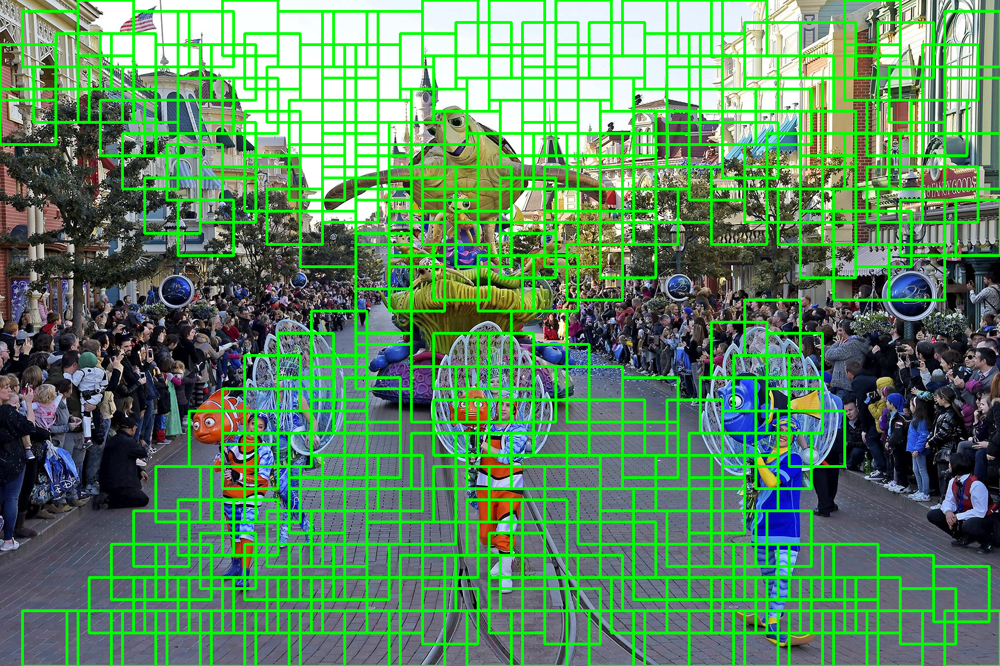

In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def sliding_window(image, step_size, window_size):
    # Slide a window across the image
    for y in range(0, image.shape[0] - window_size[1] + 1, step_size):
        for x in range(0, image.shape[1] - window_size[0] + 1, step_size):
            yield (x, y, image[y:y + window_size[1], x:x + window_size[0]])

def non_max_suppression(boxes, overlap_thresh):
    if len(boxes) == 0:
        return []

    # Convert boxes to numpy array
    boxes = np.array(boxes)

    # Get coordinates of boxes
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]

    # Compute area of boxes
    area = (x2 - x1 + 1) * (y2 - y1 + 1)

    # Sort boxes by their scores
    idxs = np.argsort(y2)

    selected_boxes = []

    while len(idxs) > 0:
        last = len(idxs) - 1
        i = idxs[last]
        selected_boxes.append(boxes[i])

        # Find intersection coordinates
        xx1 = np.maximum(x1[i], x1[idxs[:last]])
        yy1 = np.maximum(y1[i], y1[idxs[:last]])
        xx2 = np.minimum(x2[i], x2[idxs[:last]])
        yy2 = np.minimum(y2[i], y2[idxs[:last]])

        # Compute width and height of intersection
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)

        # Compute overlap ratio
        overlap_area = (w * h) / area[idxs[:last]]

        # Delete boxes with overlap greater than threshold
        idxs = np.delete(idxs, np.concatenate(([last], np.where(overlap_area > overlap_thresh)[0])))

    return selected_boxes

def detect_objects(image_path, step_size, window_size, overlap_thresh, threshold):
    # Load image
    image = cv2.imread(image_path)
    if image is None:
        print("Error: Unable to load image.")
        return

    # Initialize list to store positive detections
    positive_detections = []

    # Scan the image with sliding window approach
    for (x, y, window) in sliding_window(image, step_size, window_size):
        # Perform object detection on the window
        # For demonstration purposes, we'll assume a simple thresholding method
        if np.mean(window) > threshold:
            positive_detections.append((x, y, x + window_size[0], y + window_size[1]))

    # Apply non-maximum suppression
    selected_boxes = non_max_suppression(positive_detections, overlap_thresh)

    # Draw selected boxes on the original image
    for (x1, y1, x2, y2) in selected_boxes:
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 3)

    # Display the result
    cv2_imshow(image)

image_path = '/content/drive/MyDrive/Data Sci 3/Guide-To-Disneyland-Paris-Disney-On-Parade-1.jpg'
step_size = 20
window_size = (100, 100)
overlap_thresh = 0.3
threshold = 100
detect_objects(image_path, step_size, window_size, overlap_thresh, threshold)


## 4. Supplementary Activity

Perform **People Detection** using the aforementioned methods.

Your output should display bounding boxes around people detected. Your task is:
* Debug the code if your intended output is not being displayed.
* Enumerate the problems encountered and actions taken.
* Evaluate the performance of the object detection technique.



## 5. Summary, Conclusions and Lessons Learned

For this activity, we are tasked with performing object detection and recognition techniques. In the above procedure, I import two images: one is for sizing the image. In the above code for resizing images, it iterates the program until it reaches the exact images that the program wants to get. For the second procedure, which is for object detection, as we can see in the above output, it draws a small square for each detected object. However, those people don't have any small boxes at all.

<hr/>

***Proprietary Clause***

*Property of the Technological Institute of the Philippines (T.I.P.). No part of the materials made and uploaded in this learning management system by T.I.P. may be copied, photographed, printed, reproduced, shared, transmitted, translated, or reduced to any electronic medium or machine-readable form, in whole or in part, without the prior consent of T.I.P.*